In [15]:
pip install ipykernel -U --user --force-reinstall

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [12]:
pip install --upgrade pip

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [3]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [4]:
pip install --upgrade tensorflow-gpu --user


Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [5]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [6]:
pip install tensorflow-docs

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [7]:
pip install -U --upgrade tensorflow

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [8]:
pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [11]:
pip install tensorflow==2.0

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [10]:
pip install tensorflow-gpu


Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [26]:
pip install --upgrade pip setuptools


Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [27]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [28]:
pip install -U matplotlib

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [29]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [30]:
pip install imageio

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [34]:
pip install tensorflow_docs


Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [35]:
pip install keras


Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [16]:
from tensorflow_docs.vis import embed
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

ModuleNotFoundError: No module named 'tensorflow_docs'

In [37]:
pip install os

Note: you may need to restart the kernel to use updated packages.


c:\Python311\python.exe: No module named pip


In [43]:
import os
DATA_FOLDER = 'C:\\Users\\amarn\\OneDrive\\Documents\\Deepfake Detection\\DATA_FOLDER'
TRAIN_SAMPLE_FOLDER = 'train_sample_videos'
TEST_FOLDER = 'test_videos'

train_sample_path = os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)
test_path = os.path.join(DATA_FOLDER, TEST_FOLDER)
train_samples = len(os.listdir(train_sample_path))
test_samples = len(os.listdir(test_path))
print(f"Train samples: {train_samples}")
print(f"Test samples: {test_samples}")

FileNotFoundError: [WinError 3] The system cannot find the path specified: 'C:\\Users\\amarn\\OneDrive\\Documents\\Deepfake Detection\\DATA_FOLDER\\train_sample_videos'

In [17]:
train_sample_metadata = pd.read_json('C:\\Users\\amarn\\OneDrive\\Documents\\Deepfake Detection\\DATA_FOLDER\\train_sample_videos\\metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


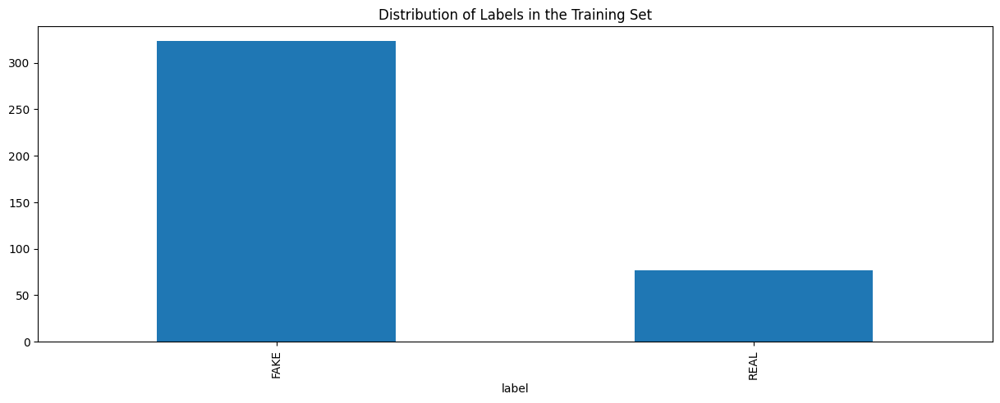

In [18]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()

In [19]:
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(3).index)
fake_train_sample_video

['dhkwmjxwrn.mp4', 'avywawptfc.mp4', 'etejaapnxh.mp4']

In [20]:
def display_image_from_video(video_path):
    
    capture_image = cv2.VideoCapture(video_path) 
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

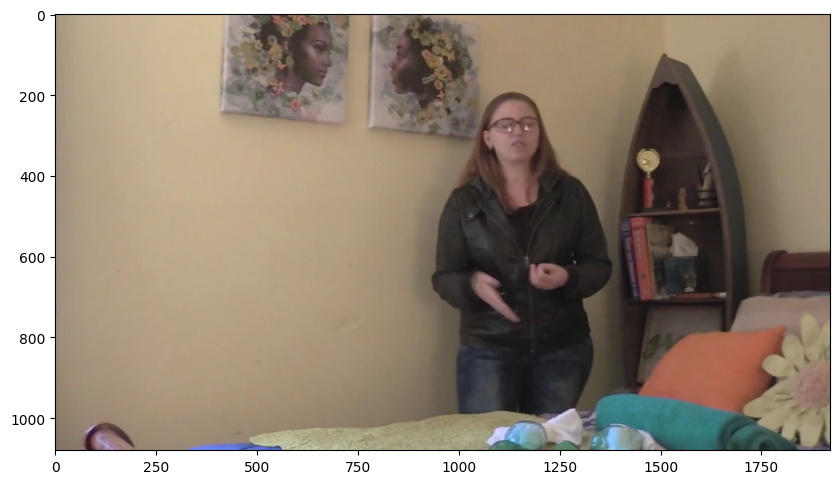

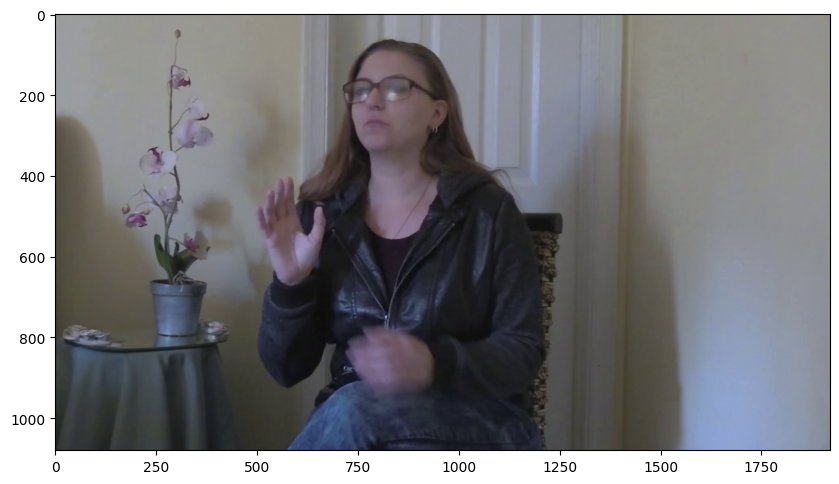

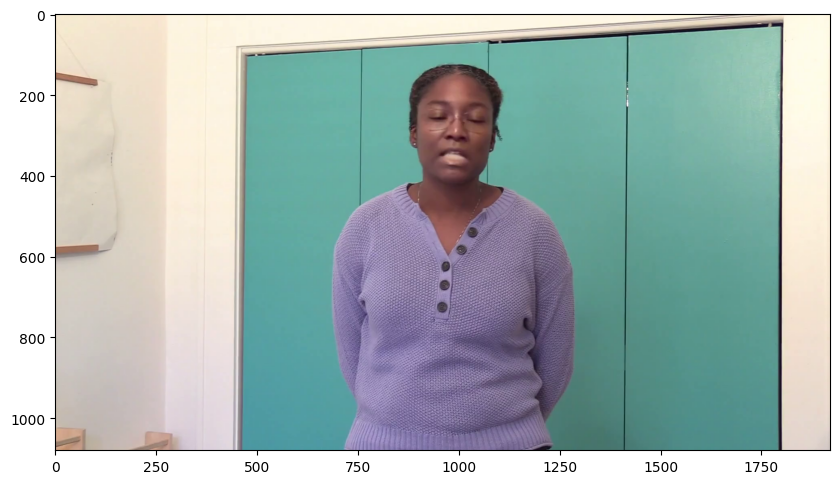

In [21]:
for video_file in fake_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

In [22]:
real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(3).index)
real_train_sample_video

['dhxctgyoqj.mp4', 'bdnaqemxmr.mp4', 'cppdvdejkc.mp4']

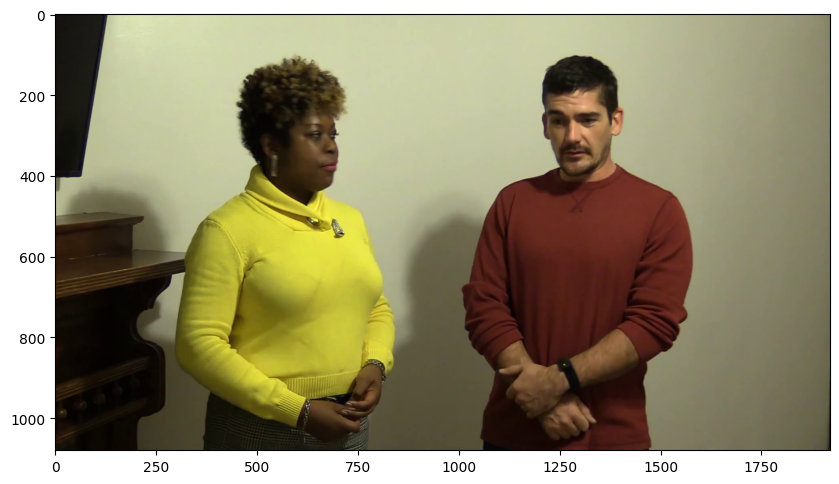

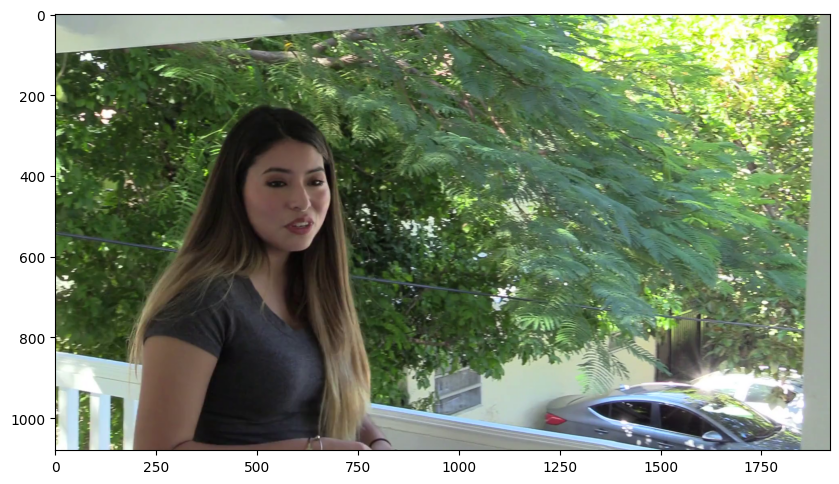

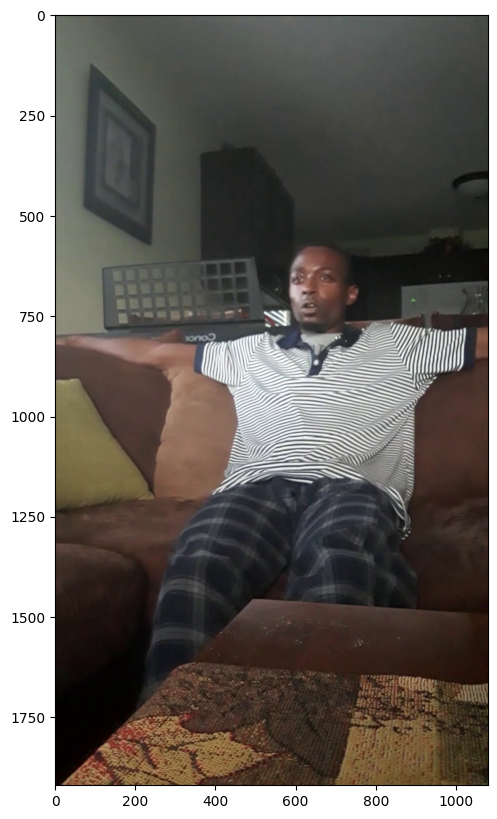

In [23]:
for video_file in real_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

In [24]:
train_sample_metadata['original'].value_counts()[0:5]

original
atvmxvwyns.mp4    6
meawmsgiti.mp4    6
qeumxirsme.mp4    5
kgbkktcjxf.mp4    5
fysyrqfguw.mp4    4
Name: count, dtype: int64

In [25]:
def display_image_from_video_list(video_path_list, video_folder=TRAIN_SAMPLE_FOLDER):
    '''
    input: video_path_list - path for video
    process:
    0. for each video in the video path list
        1. perform a video capture from the video
        2. read the image
        3. display the image
    '''
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,8))
    # we only show images extracted from the first 6 videos
    for i, video_file in enumerate(video_path_list[0:6]):
        video_path = os.path.join(DATA_FOLDER, video_folder,video_file)
        capture_image = cv2.VideoCapture(video_path) 
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[i//3, i%3].imshow(frame)
        ax[i//3, i%3].set_title(f"Video: {video_file}")
        ax[i//3, i%3].axis('on')


<Figure size 640x480 with 0 Axes>

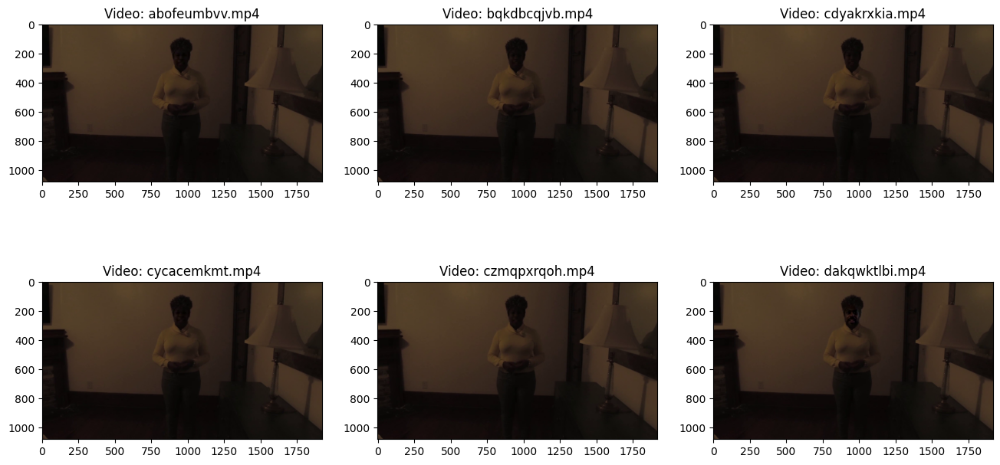

In [26]:
same_original_fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.original=='atvmxvwyns.mp4'].index)
display_image_from_video_list(same_original_fake_train_sample_video)

In [27]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

In [28]:
test_videos.head()

,video
0,aassnaulhq.mp4
1,aayfryxljh.mp4
2,acazlolrpz.mp4
3,adohdulfwb.mp4
4,ahjnxtiamx.mp4


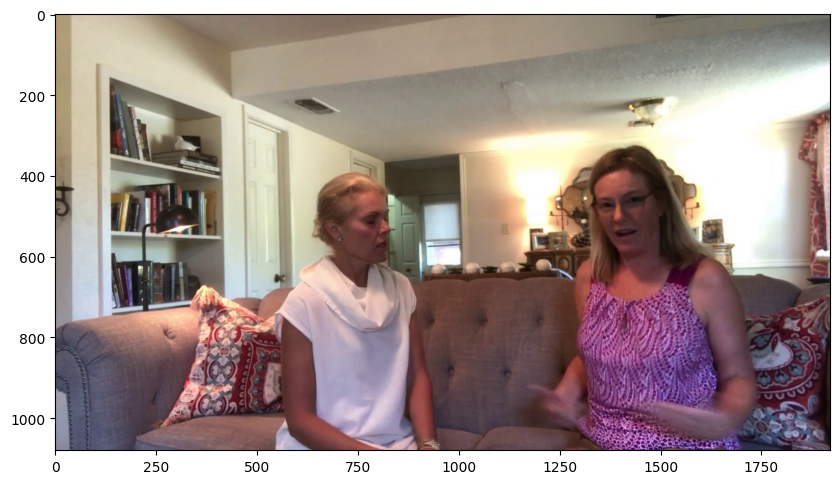

In [29]:
display_image_from_video(os.path.join(DATA_FOLDER, TEST_FOLDER, test_videos.iloc[2].video))

In [30]:
fake_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [31]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file, subset=TRAIN_SAMPLE_FOLDER):
    '''
    Display video
    param: video_file - the name of the video file to display
    param: subset - the folder where the video file is located (can be TRAIN_SAMPLE_FOLDER or TEST_Folder)
    '''
    video_url = open(os.path.join(DATA_FOLDER, subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

play_video(fake_videos[10])

In [32]:
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 10

MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

In [33]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]


def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

In [34]:
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")


feature_extractor = build_feature_extractor()

87910968/87910968 [==============================] - 7s 0us/step


In [42]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels=='FAKE').astype(int)

    
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # For each video.
    for idx, path in enumerate(video_paths):
        # Gather all its frames and add a batch dimension.
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        # Initialize placeholders to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )
            temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

        frame_features[idx,] = temp_frame_features.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels

In [37]:
pip install -U scikit-learn


  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/f1/7d/2e562207176a5dcdad513085670674bb11ffaf37e1393eacb6d7fb502481/scikit_learn-1.3.1-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for scipy>=1.5.0 from https://files.pythonhosted.org/packages/06/15/e73734f9170b66c6a84a0bd7e03586e87e77404e2eb8e34749fc49fa43f7/scipy-1.11.2-cp311-cp311-win_amd64.whl.metadata
  Using cached scipy-1.11.2-cp311-cp311-win_amd64.whl.metadata (59 kB)
  Obtaining dependency information for joblib>=1.1.1 from https://files.pythonhosted.org/packages/10/40/d551139c85db202f1f384ba8bcf96aca2f329440a844f924c8a0040b6d02/joblib-1.3.2-py3-none-any.whl.metadata
  Obtaining dependency information for threadpoolctl>=2.0.0 from https://files.pythonhosted.org/packages/81/12/fd4dea011af9d69e1cad05c75f3f7202cdcbeac9b712eea58ca779a72865/threadpoolctl-3.2.0-py3-none-any.whl.metadata
  Using cached threadpoolctl-3.2.0-py3-none-any.whl.metadata (10.0 kB)
   --

In [43]:
from sklearn.model_selection import train_test_split

Train_set, Test_set = train_test_split(train_sample_metadata,test_size=0.1,random_state=42,stratify=train_sample_metadata['label'])

print(Train_set.shape, Test_set.shape )

(360, 3) (40, 3)


In [44]:
train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "test")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")

Frame features in train set: (360, 20, 2048)
Frame masks in train set: (360, 20)


In [45]:
frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

# Refer to the following tutorial to understand the significance of using `mask`:
# https://keras.io/api/layers/recurrent_layers/gru/
x = keras.layers.GRU(16, return_sequences=True)(
    frame_features_input, mask=mask_input
)
x = keras.layers.GRU(8)(x)
x = keras.layers.Dropout(0.4)(x)
x = keras.layers.Dense(8, activation="relu")(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)

model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 20, 2048)]           0         []                            
                                                                                                  
 input_4 (InputLayer)        [(None, 20)]                 0         []                            
                                                                                                  
 gru (GRU)                   (None, 20, 16)               99168     ['input_3[0][0]',             
                                                                     'input_4[0][0]']             
                                                                                                  
 gru_1 (GRU)                 (None, 8)                    624       ['gru[0][0]']             

In [46]:
checkpoint = keras.callbacks.ModelCheckpoint('./', save_weights_only=True, save_best_only=True)
history = model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_data=([test_data[0], test_data[1]],test_labels),
        callbacks=[checkpoint],
        epochs=EPOCHS,
        batch_size=8
    )

Epoch 1/10
45/45 [==============================] - 12s 97ms/step - loss: 0.6865 - accuracy: 0.8028 - val_loss: 0.6804 - val_accuracy: 0.8000
Epoch 2/10
45/45 [==============================] - 1s 18ms/step - loss: 0.6742 - accuracy: 0.8083 - val_loss: 0.6691 - val_accuracy: 0.8000
Epoch 3/10
45/45 [==============================] - 1s 18ms/step - loss: 0.6626 - accuracy: 0.8083 - val_loss: 0.6583 - val_accuracy: 0.8000
Epoch 4/10
45/45 [==============================] - 1s 19ms/step - loss: 0.6518 - accuracy: 0.8083 - val_loss: 0.6476 - val_accuracy: 0.8000
Epoch 5/10
45/45 [==============================] - 1s 22ms/step - loss: 0.6414 - accuracy: 0.8083 - val_loss: 0.6381 - val_accuracy: 0.8000
Epoch 6/10
45/45 [==============================] - 1s 25ms/step - loss: 0.6317 - accuracy: 0.8083 - val_loss: 0.6289 - val_accuracy: 0.8000
Epoch 7/10
45/45 [==============================] - 1s 20ms/step - loss: 0.6226 - accuracy: 0.8083 - val_loss: 0.6203 - val_accuracy: 0.8000
Epoch 8/10
4

In [48]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

def sequence_prediction(path):
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]
    
# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.5):
    print(f'The predicted class of the video is FAKE')
else:
    print(f'The predicted class of the video is REAL')

play_video(test_video,TEST_FOLDER)

Test video path: zfrrixsimm.mp4
1/1 [==============================] - 0s 34ms/step
The predicted class of the video is REAL
